Required libraries for this project

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.offline as py
import plotly.express as px
import plotly.graph_objs as go
import plotly.tools as tls
plt.style.use('fivethirtyeight')
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import pearsonr, ttest_ind, ttest_1samp, norm, mannwhitneyu
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, mean_squared_error, r2_score
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
import folium
import folium.plugins
from scipy.stats import t
import warnings 
warnings.filterwarnings('ignore')
py.init_notebook_mode(connected=True)
sns.set(style='whitegrid')

For this project, I used three datasets.

# Data cleaning process:
- Sort basic columns from the base dataset
- Merge two secondary datasets with the base dataset
- Created sub-version of the dataset without extreme outliers

## First dataset: Global Terrorism Database

In [2]:
# Load with pandas dataframe
terror = pd.read_csv('data/globalterrorismdb_0718dist.csv', encoding='ISO-8859-1', dtype = "object")
# Select columns for the EDA
new_terror = terror[['iyear', 'country_txt', 'region_txt', 'latitude', 'longitude', 'attacktype1_txt', 'gname']].copy()
# Add 'year' column for same values from the 'iyear'
new_terror['year'] = pd.to_numeric(new_terror['iyear'])
# Drop iyear column
new_terror.drop(columns='iyear', inplace=True)
# Set the dataframe parameter from 2001 to 2017
new_terror_after_2000 = new_terror[new_terror['year'] >= 2001].copy()
# Reset the column order as easier to navigate
new_column_order = ['year', 'country_txt', 'region_txt', 'latitude', 'longitude', 'attacktype1_txt', 'gname']
new_terror_after_2000 = new_terror_after_2000.reindex(columns=new_column_order)

In [3]:
# Test the output
new_terror_after_2000.head(2)

,year,country_txt,region_txt,latitude,longitude,attacktype1_txt,gname
71650,2001,Colombia,South America,3.800889,-76.641271,Unknown,Paramilitaries
71651,2001,Yemen,Middle East & North Africa,12.825647,44.846416,Bombing/Explosion,Unknown


## Create a offset dataset for mapping 

In [4]:
# Remove 'NaN' values from 'latitude', and 'longitude'
for_map = new_terror_after_2000.dropna(subset=['latitude', 'longitude'])

### Graphic overview of terrorism incidents (2001 - 2017)

In [5]:
# There are 12 regions in this dataset. Give unique colors for each regions.
color_scale = {
    'South America': 'blue',
    'Middle East & North Africa': 'red',
    'Eastern Europe': 'green',
    'North America': 'orange',
    'Western Europe': 'purple',
    'South Asia': 'yellow',
    'Sub-Saharan Africa': 'pink',
    'Southeast Asia': 'brown',
    'Central America & Caribbean': 'cyan',
    'East Asia': 'magenta',
    'Central Asia': 'gray',
    'Australasia & Oceania': 'black'
}

for_map['color'] = for_map['region_txt'].map(color_scale)

fig = go.Figure(go.Scattermapbox(
    lat=for_map['latitude'],
    lon=for_map['longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=6,
        color=for_map['color'],  
        opacity=0.7
    ),
    text=for_map['country_txt']
))

fig.update_layout(
    mapbox=dict(
        style='carto-positron',
        center=dict(lat=0, lon=0),
        zoom=1.7
    ),
    margin=dict(l=0, r=0, t=0, b=0),
    title='Terrorist Incidents After 2000',
    height=800, width=1400
)

fig.show()

### Heatmap by regions for overview

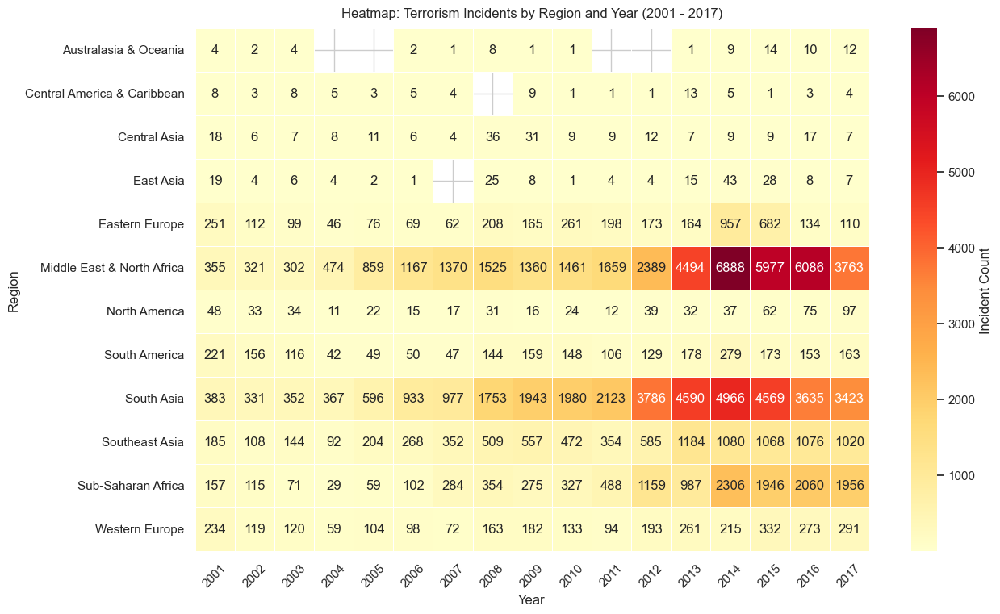

In [6]:
# Sort by years and regions of terrorism incidents
heatmap_data = new_terror_after_2000.pivot_table(index='region_txt', columns='year', values='latitude', aggfunc='count')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', annot=True, fmt='g', linewidths=0.5, cbar_kws={'label': 'Incident Count'})
plt.xlabel('Year')
plt.ylabel('Region')
plt.xticks(rotation=45, ha='center')
plt.title('Heatmap: Terrorism Incidents by Region and Year (2001 - 2017)', pad=10, )
plt.show()

## Back to the original data cleaning process

In [7]:
# Count the number of incidents by country and year and add a new column, 'incident_count'
incidents_year_and_country = new_terror_after_2000.groupby(['year', 'country_txt', 'region_txt']).size().reset_index(name='incident_count')

Merge and don't drop 0 values for GDP data

In [10]:
logi_gdp_main = pd.merge(gdp_capita, incidents_year_and_country, right_on=['country_txt', 'year'], left_on=['Entity', 'Year'])

NameError: name 'gdp_capita' is not defined

In [ ]:
korea_rows = logi_gdp_main[logi_gdp_main['country_txt'] == 'South Korea']
korea_rows

,Entity,Code,Year,"Average harmonised learning outcome score (Altinok, Angrist, and Patrinos (2018))",GDP per capita,417485-annotations,Population (historical estimates),Continent,year,country_txt,region_txt,incident_count
1055,South Korea,KOR,2015,607.23,35269.000,NaN,50994396.0,Asia,2015,South Korea,East Asia,1
1056,South Korea,KOR,2001,NaN,23804.438,NaN,47064784.0,NaN,2001,South Korea,East Asia,1
1057,South Korea,KOR,2003,NaN,25679.246,NaN,47539740.0,NaN,2003,South Korea,East Asia,1
1058,South Korea,KOR,2006,NaN,28516.484,NaN,48049348.0,NaN,2006,South Korea,East Asia,1
1059,South Korea,KOR,2016,NaN,36103.000,NaN,51309984.0,NaN,2016,South Korea,East Asia,1


In [ ]:
logi_gdp_main

,year,country_txt,region_txt,incident_count,Entity,Year,GDP per capita,Population (historical estimates)
0,2001,Afghanistan,South Asia,14,Afghanistan,2001,489.6820,19688634.0
1,2001,Albania,Eastern Europe,1,Albania,2001,5285.8090,3153615.0
2,2001,Algeria,Middle East & North Africa,113,Algeria,2001,7218.2456,31200984.0
3,2001,Angola,Sub-Saharan Africa,40,Angola,2001,2162.4850,16941584.0
4,2001,Argentina,South America,2,Argentina,2001,13651.9810,37480492.0
...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,Venezuela,2017,12879.1350,30563430.0
1237,2017,Vietnam,Southeast Asia,2,Vietnam,2017,6422.0864,94033048.0
1238,2017,Yemen,Middle East & North Africa,226,Yemen,2017,2321.9238,30034386.0
1239,2017,Zambia,Sub-Saharan Africa,2,Zambia,2017,3497.5818,17298056.0


In [ ]:
incidents_year_and_country

,year,country_txt,region_txt,incident_count
0,2001,Afghanistan,South Asia,14
1,2001,Albania,Eastern Europe,1
2,2001,Algeria,Middle East & North Africa,113
3,2001,Angola,Sub-Saharan Africa,40
4,2001,Argentina,South America,2
...,...,...,...,...
1427,2017,Vietnam,Southeast Asia,2
1428,2017,West Bank and Gaza Strip,Middle East & North Africa,83
1429,2017,Yemen,Middle East & North Africa,226
1430,2017,Zambia,Sub-Saharan Africa,2


In [ ]:
# The difference between the above code and this code is the total 'sum' of the incident count
total_incidents_by_country = incidents_year_and_country.groupby(['country_txt', 'region_txt'])['incident_count'].sum().reset_index(name='total_incidents')
total_incidents_by_country = total_incidents_by_country.sort_values(by='total_incidents', ascending=False)

In [ ]:
incidents_year_and_country.head(2)

,year,country_txt,region_txt,incident_count
0,2001,Afghanistan,South Asia,14
1,2001,Albania,Eastern Europe,1


### Find the average incidents nnumber per year

In [ ]:
average_incidents_year_and_country = incidents_year_and_country['incident_count'].mean().round()
average_incidents_year_and_country

77.0

### Plot the total incident numbers by year

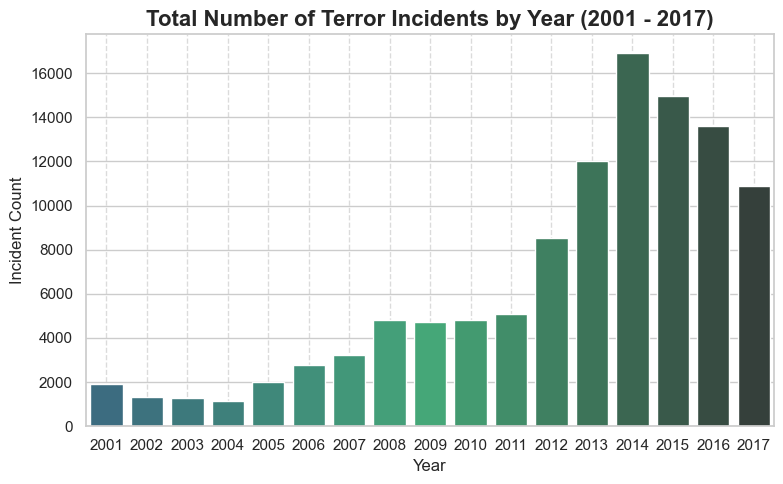

In [ ]:
incidents_by_year = incidents_year_and_country.groupby('year')['incident_count'].sum().reset_index(name='sum')
incidents_by_year = incidents_by_year.sort_values(by='year', ascending=False)
incidents_by_year['year'] = incidents_by_year['year'].astype(int)

# Sort the DataFrame by 'year' in descending order
by_year = incidents_by_year.sort_values(by='year', ascending=False)

# Create the horizontal bar chart
plt.figure(figsize=(8, 5))
sns.barplot(x='year', y='sum', data=by_year, palette='viridis_d')
plt.xlabel('Year')
plt.ylabel('Incident Count')
plt.title('Total Number of Terror Incidents by Year (2001 - 2017)'
          , fontsize = 16, fontweight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


### Find basic mathmatical information for logistic regressions

In [ ]:
average_incidents_by_country = total_incidents_by_country['total_incidents'].mean().round()
max_incidents_by_country = total_incidents_by_country['total_incidents'].max()
min_incidents_by_country = total_incidents_by_country['total_incidents'].min()
median_incident_by_country = total_incidents_by_country['total_incidents'].median()

print(f"Average number of terrorism incidents from 2001 to 2017 by country:", average_incidents_by_country)
print(f"Maximum number of terrorism incidents from 2001 to 2017 by country:", max_incidents_by_country)
print(f"Minium number of terrorism incidents from 2001 to 2017 by country:", min_incidents_by_country)
print(f"Median number of terrorism incidents from 2001 to 2017 by country:", median_incident_by_country)

Average number of terrorism incidents from 2001 to 2017 by country: 671.0
Maximum number of terrorism incidents from 2001 to 2017 by country: 24465
Minium number of terrorism incidents from 2001 to 2017 by country: 1
Median number of terrorism incidents from 2001 to 2017 by country: 23.0


### Create a pie chart with top 10 countries by incident numbers

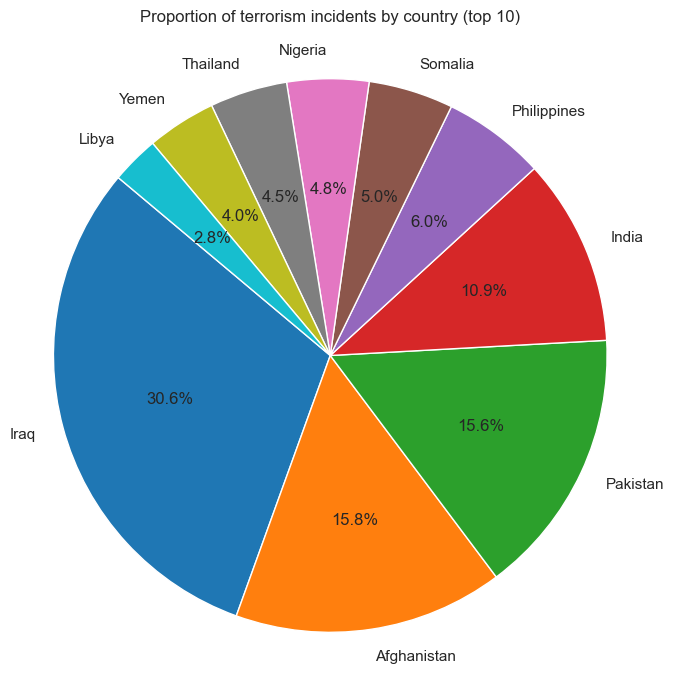

In [ ]:
custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

top_countries = total_incidents_by_country.nlargest(10, 'total_incidents')
plt.figure(figsize=(7, 7))
plt.pie(top_countries['total_incidents'], labels=top_countries['country_txt'], autopct='%1.1f%%', startangle=140, colors=custom_colors)
plt.title('Proportion of terrorism incidents by country (top 10)')
plt.axis('equal')
plt.subplots_adjust(top=1)
plt.show()

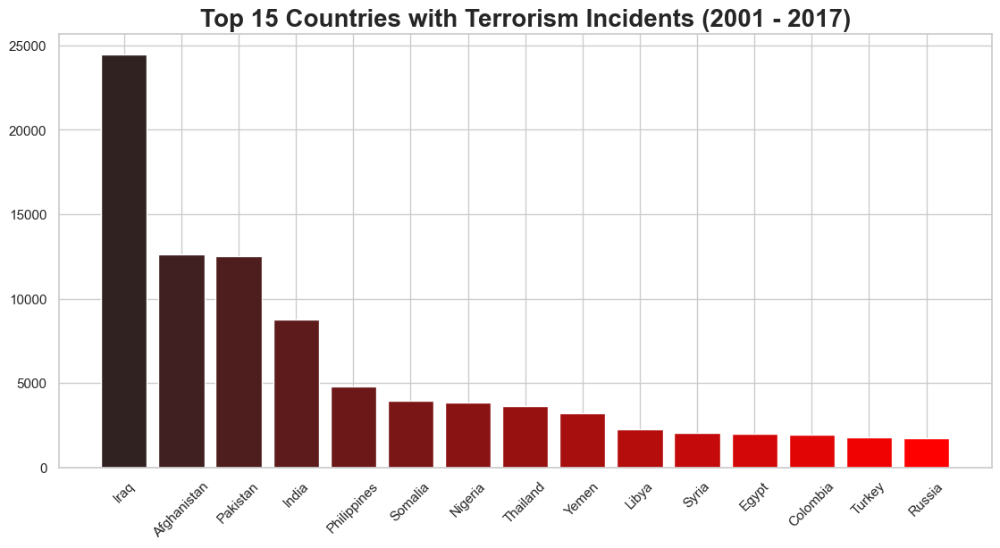

In [ ]:
# Create a color palette
n_colors = 15
gradient_palette = sns.dark_palette("red", n_colors=n_colors)
# Plot the bar chart with the custom color palette
plt.figure(figsize=(12, 6))
plt.bar(total_incidents_by_country['country_txt'].head(15), total_incidents_by_country['total_incidents'].head(15), color=gradient_palette)
plt.xticks(rotation=45, ha='center')
plt.title("Top 15 Countries with Terrorism Incidents (2001 - 2017)", fontsize=20, fontweight='bold')
plt.show()

## Load the second dataset: Population and GDP per capita

In [ ]:
# Load the data
gdp_capita = pd.read_csv('data/per_capita.csv')
# Filter 'Year' from 2001 to 2017 to merge with global terrorism dataset
gdp_filtered = gdp_capita[(gdp_capita['Year'] >= 2001) & (gdp_capita['Year'] <= 2017)]
gdp_filtered.drop(gdp_filtered.columns[[1, 3, 5, 7]], axis=1, inplace=True)
gdp = gdp_filtered.dropna()

In [ ]:
gdp_capita = pd.read_csv('data/per_capita.csv')


In [ ]:
gdp_filtered = gdp_capita[(gdp_capita['Year'] >= 2001) & (gdp_capita['Year'] <= 2017)]


In [ ]:
korea_rows = gdp_capita[gdp_capita['Entity'] == 'South Korea']


In [ ]:
korea_rows

,Entity,Code,Year,"Average harmonised learning outcome score (Altinok, Angrist, and Patrinos (2018))",GDP per capita,417485-annotations,Population (historical estimates),Continent
51041,South Korea,KOR,1985,519.99,8859.355,NaN,41232700.0,NaN
51042,South Korea,KOR,1990,553.58,13874.000,NaN,44120040.0,NaN
51043,South Korea,KOR,1995,580.79,19089.299,NaN,45393416.0,NaN
51044,South Korea,KOR,2000,587.90,23108.018,NaN,46788588.0,NaN
51045,South Korea,KOR,2005,594.41,27443.283,NaN,47889576.0,NaN
...,...,...,...,...,...,...,...,...
51295,South Korea,KOR,1944,NaN,NaN,NaN,17034244.0,NaN
51296,South Korea,KOR,1945,NaN,NaN,NaN,17532227.0,NaN
51297,South Korea,KOR,2019,NaN,NaN,NaN,51803832.0,NaN
51298,South Korea,KOR,2020,NaN,NaN,NaN,51844688.0,NaN


In [ ]:
# Check data
gdp.head(3)

,Entity,Year,GDP per capita,Population (historical estimates)
52,Afghanistan,2001,489.6820,19688634.0
53,Afghanistan,2002,796.8166,21000258.0
54,Afghanistan,2003,842.8052,22645136.0


## Merge the second data with the first dataset

In [ ]:
incident_gdp = pd.merge(incidents_year_and_country, gdp, left_on=['country_txt', 'year'], right_on=['Entity', 'Year'])
incident_gdp.drop(columns=['Entity', 'Year'], inplace=True)
# Simplify the name of population column
incident_gdp.rename(columns={'Population (historical estimates)': 'population'}, inplace=True)
# Add a new column called 'incident_per_capita (incident count / population)
incident_gdp['incident_per_capita'] = incident_gdp['incident_count'] / incident_gdp['population']
# Check the result
incident_gdp.head(2)

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita
0,2001,Afghanistan,South Asia,14,489.682,19688634.0,7.110702e-07
1,2001,Albania,Eastern Europe,1,5285.809,3153615.0,3.170964e-07


## Load the last dataset: Mean education level per year

In [ ]:
# Load data
education = pd.read_csv('data/mean-years-of-schooling-long-run.csv')
# Set the timeframe from 2001 to 2017
education_after_2000 = education[(education['Year'] >= 2001) & (education['Year'] <= 2017)]
# Change a column name to short version
education_after_2000.rename(columns={
    'Average Total Years of Schooling for Adult Population (Lee-Lee (2016), Barro-Lee (2018) and UNDP (2018))': 'education_level'
}, inplace=True)
# Drop unnecessary column
education_after_2000 = education_after_2000.drop(columns='Code')
education_after_2000.head(2)

,Entity,Year,education_level
35,Afghanistan,2001,2.2
36,Afghanistan,2002,2.3


### Merge with two other datasets

In [ ]:
incident_gdp_edu = pd.merge(incident_gdp, education_after_2000, left_on=['year', 'country_txt'], right_on=['Year', 'Entity'], how='left')
incident_gdp_edu.tail(2)

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,Entity,Year,education_level
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,Zambia,2017.0,7.0
1240,2017,Zimbabwe,Sub-Saharan Africa,3,1582.3662,14751101.0,2.033746e-07,Zimbabwe,2017.0,8.2


In [ ]:
# Identify missing values
incident_gdp_edu.isnull().sum()

year                    0
country_txt             0
region_txt              0
incident_count          0
GDP per capita          0
population              0
incident_per_capita     0
Entity                 17
Year                   17
education_level        17
dtype: int64

In [ ]:
average_education_level = incident_gdp_edu['education_level'].mean()
incident_gdp_edu['education_level'].fillna(average_education_level, inplace=True)
incident_gdp_edu = incident_gdp_edu.drop(columns=['Entity', 'Year'])
incident_gdp_edu.tail(2)

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0
1240,2017,Zimbabwe,Sub-Saharan Africa,3,1582.3662,14751101.0,2.033746e-07,8.2


# Rename the final data set as final_data

In [ ]:
final_data = incident_gdp_edu
final_data.head(3)

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1


Create a heatmap shows the education level by region

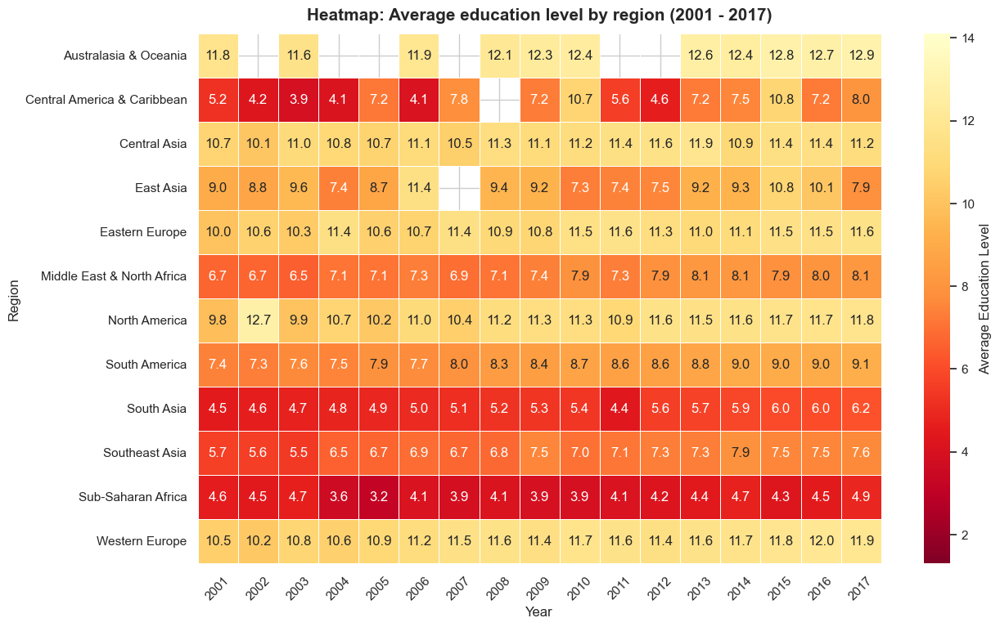

In [ ]:
heatmap_data = final_data.pivot_table(index='region_txt', columns='year', values='education_level', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd_r', annot=True, fmt='.1f', linewidths=0.5, cbar_kws={'label': 'Average Education Level'}, vmin=final_data['education_level'].min(), vmax=final_data['education_level'].max())
plt.xlabel('Year')
plt.ylabel('Region')
plt.xticks(rotation=45, ha='center')
plt.title('Heatmap: Average education level by region (2001 - 2017)', pad=12, fontsize=15, fontweight='bold')
plt.show()


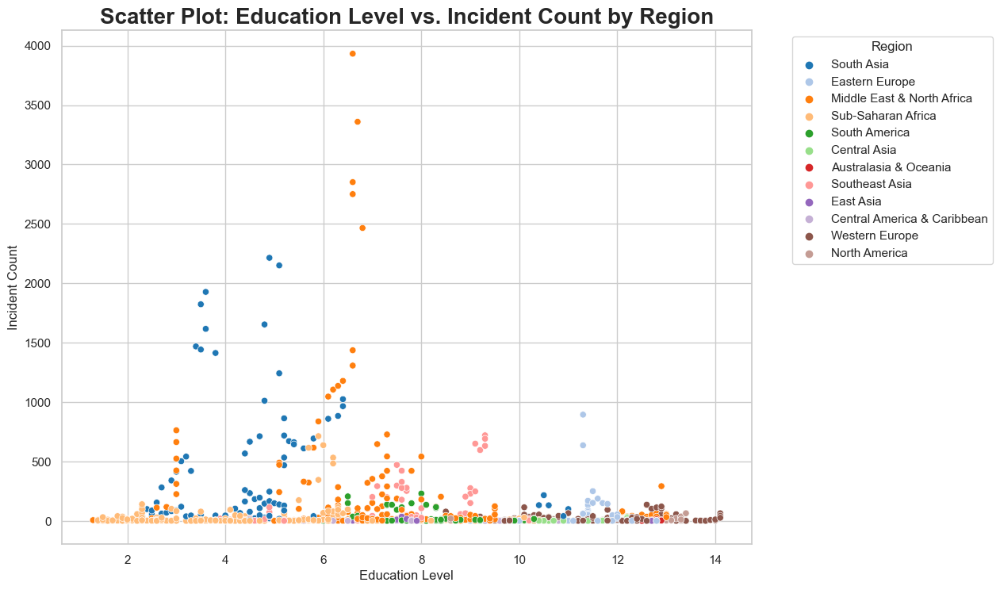

In [ ]:
education_level_cleaned = final_data['education_level']
incident_count_cleaned = final_data['incident_count']
gdp_count_cleaned = final_data['GDP per capita']
region_txt = final_data['region_txt']

plt.figure(figsize=(10, 8))
sns.scatterplot(x=final_data['education_level'], y=incident_count_cleaned, hue=region_txt, palette='tab20')
plt.xlabel('Education Level')
plt.ylabel('Incident Count')
plt.title('Scatter Plot: Education Level vs. Incident Count by Region', fontsize=20, fontweight='bold')
plt.grid(True)
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

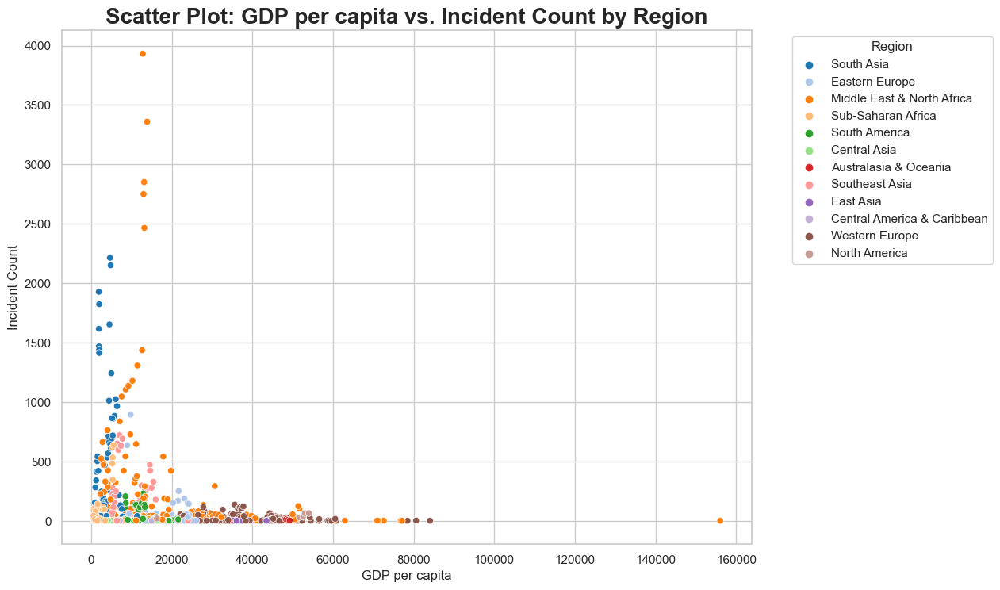

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x=final_data['GDP per capita'], y=incident_count_cleaned, hue=region_txt, palette='tab20')
plt.xlabel('GDP per capita')
plt.ylabel('Incident Count')
plt.title('Scatter Plot: GDP per capita vs. Incident Count by Region', fontsize=20, fontweight='bold')
plt.grid(True)
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

### Linear regression model between GDP per capita and incident count

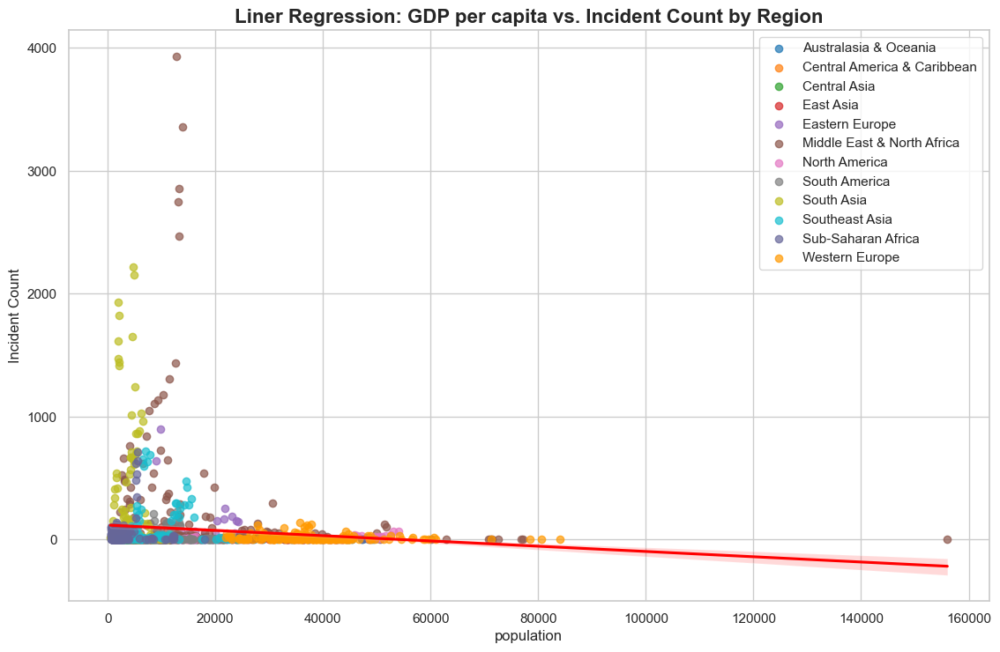

In [ ]:
# Linear regression "GDP per capita" and "incident_count"

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
                 '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
                 '#666699', '#ff9900']

selected_data = final_data.groupby('region_txt')

# Scatter plot by regions
plt.figure(figsize=(12, 8))
for i, (region, group) in enumerate(selected_data):
    GDP_per_capita = group['GDP per capita']
    incident_count = group['incident_count']
    plt.scatter(GDP_per_capita, incident_count, alpha=0.7, label=region, color=colors[i])

# Regression line
sns.regplot(x=final_data['GDP per capita'], y=final_data['incident_count'], scatter=False, color='red')

plt.xlabel('population')
plt.ylabel('Incident Count')
plt.title('Liner Regression: GDP per capita vs. Incident Count by Region', fontsize = 16, fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()

### Linear regression model between education level and incident count

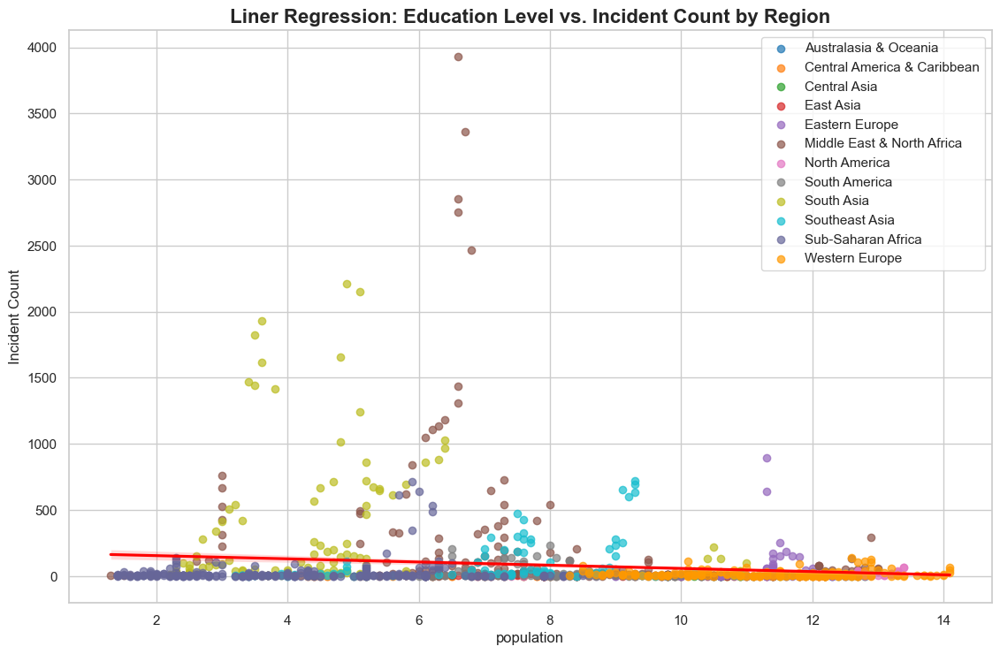

In [ ]:
# Linear regression "GDP per capita" and "incident_count"

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
                 '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
                 '#666699', '#ff9900']

selected_data = final_data.groupby('region_txt')

# Scatter plot by regions
plt.figure(figsize=(12, 8))
for i, (region, group) in enumerate(selected_data):
    education_level = group['education_level']
    incident_count = group['incident_count']
    plt.scatter(education_level, incident_count, alpha=0.7, label=region, color=colors[i])

# Regression line
sns.regplot(x=final_data['education_level'], y=final_data['incident_count'], scatter=False, color='red')

plt.xlabel('population')
plt.ylabel('Incident Count')
plt.title('Liner Regression: Education Level vs. Incident Count by Region', fontsize = 16, fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()

Ordinary Least Squares (OLS) regression results with education level and GDP per capita

In [ ]:
# Define independent & dependent variable
X = final_data[['education_level', 'GDP per capita']]
y = final_data['incident_count']
# Fit the multiple linear regression model due to having two independent variables
model = sm.OLS(y, X).fit()
# Print the summary
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:         incident_count   R-squared (uncentered):                   0.052
Model:                            OLS   Adj. R-squared (uncentered):              0.051
Method:                 Least Squares   F-statistic:                              34.01
Date:                Fri, 04 Aug 2023   Prob (F-statistic):                    4.19e-15
Time:                        17:12:14   Log-Likelihood:                         -8811.5
No. Observations:                1241   AIC:                                  1.763e+04
Df Residuals:                    1239   BIC:                                  1.764e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

The result: 
- R-squared: 0.052, approximately 5.2% of the variance in incident_count is explained by the two independent variables in the model.
- F-statistic: 34.01. The associated p-value (Prob (F-statistic)) is low (4.19e-15), which indiciates that there is a significant relationship between the independent variables and the dependent variable.

Although, multiple factors suggest that there are relationships between independent and dependent variables, the low R-squared score indicate that that are other factors contribute to the variation in incident count.

## Correlation Analysis

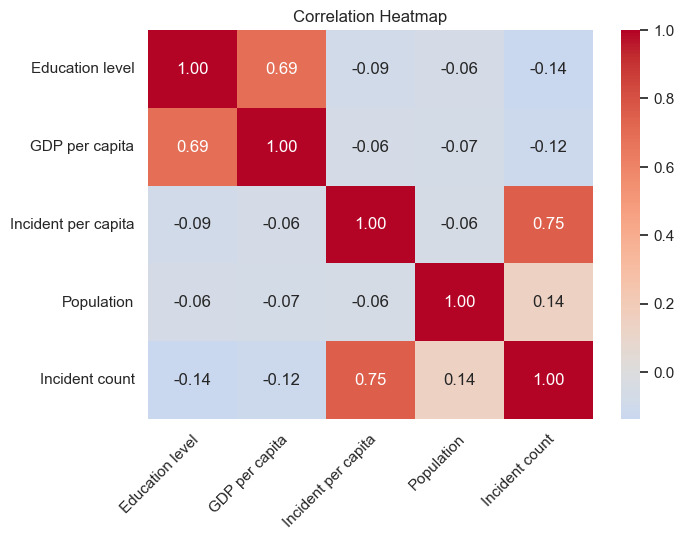

In [ ]:
correlation_matrix = final_data[['education_level', 'GDP per capita', 'incident_per_capita', 'population', 'incident_count']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Heatmap')
labels = ['Education level', 'GDP per capita', 'Incident per capita', 'Population', 'Incident count']
plt.xticks(ticks=[0.6,1.6,2.6,3.6,4.6], labels=labels, rotation=45, ha='right')
plt.yticks(ticks=[0.5,1.5,2.5,3.5,4.5], labels=labels, ha='right')
plt.show()

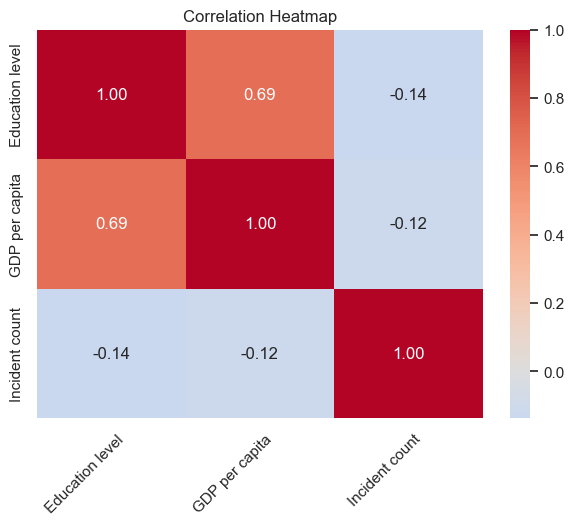

In [ ]:
correlation_matrix2 = final_data[['education_level', 'GDP per capita', 'incident_count']].corr()
sns.heatmap(correlation_matrix2, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Heatmap')
labels = ['Education level', 'GDP per capita', 'Incident count']
plt.xticks(ticks=[0.6,1.6,2.6], labels=labels, rotation=45, ha='right')
plt.yticks(ticks=[0.5,1.5,2.5], labels=labels, ha='right')
plt.show()

Correlation analysis explanation
- Positive correlation between 'education_level' and 'GDP per capita' (correlation coefficient: 0.693)
- Negative correlation between 'education_level' and 'incident_count' (correlation coefficient: -0.138)
- The correlation between 'GDP per capita' and 'incident_count' is weak (correlation coefficient: -0.119)

# Hypothesis testing

* Null Hypothesis (H0): Lack of education in developing countries has no significant relationship with participation in violent extremist activities.
* Alternative Hypothesis (H1): Lack of education in developing countries significantly relates to participation in violent extremist activities.

* Objectives: Determine whether the model is statistically significant and whether at least one independent variable significantly impacts the dependent variable.

What is the T-test? (sample vs. population)
- It determines the sample data and its ability to provide valuable insights about the population. 
- If the p-value is more significant than 0.05, it fails to reject the null hypothesis. In other words, there is insufficient evidence to conclude that the sample mean significantly differs from the hypothesized population mean.

#### T-Test between different regions

In [ ]:
# Separate by 'region' data from the population
sub_sahara_education_data = final_data[final_data['region_txt'] == 'Sub-Saharan Africa']['education_level']
mena_education_data = final_data[final_data['region_txt'] == 'Middle East & North Africa']['education_level']
western_europe_education_data = final_data[final_data['region_txt'] == 'Western Europe']['education_level']
south_america_education_data = final_data[final_data['region_txt'] == 'South America']['education_level']
north_america_education_data = final_data[final_data['region_txt'] == 'North America']['education_level']
south_asia_education_data = final_data[final_data['region_txt'] == 'South Asia']['education_level']
southeast_asia_education_data = final_data[final_data['region_txt'] == 'Southeast Asia']['education_level']
central_asia_education_data = final_data[final_data['region_txt'] == 'Central Asia']['education_level']
eastern_europe_education_data = final_data[final_data['region_txt'] == 'Eastern Europe']['education_level']
caribbean_education_data = final_data[final_data['region_txt'] == 'Central America & Caribbean']['education_level']
oceania_education_data = final_data[final_data['region_txt'] == 'Australasia & Oceania']['education_level']
# Select the sample size
sample_size = 300
# Create the sample variables
sample_edu_sub_sahara= np.random.choice(sub_sahara_education_data, size=sample_size)
sample_edu_mena = np.random.choice(mena_education_data, size=sample_size)
sample_edu_western_europe = np.random.choice(western_europe_education_data, size=sample_size)
sampe_edu_south_america = np.random.choice(south_america_education_data, size=sample_size)
sampe_edu_north_america = np.random.choice(north_america_education_data, size=sample_size)
sample_edu_south_asia = np.random.choice(south_asia_education_data, size=sample_size)
sample_edu_southeast_asia = np.random.choice(southeast_asia_education_data, size=sample_size)
sample_edu_central_asia = np.random.choice(central_asia_education_data, size=sample_size)
sample_edu_eastern_europe = np.random.choice(eastern_europe_education_data, size=sample_size)
sample_edu_western_europe = np.random.choice(western_europe_education_data, size=sample_size)
sample_edu_caribbean = np.random.choice(caribbean_education_data, size=sample_size)
sample_edu_oceania = np.random.choice(oceania_education_data, size=sample_size)
# Perform the t-test between two regions 
t_statistic, p_value = stats.ttest_ind(south_asia_education_data, sub_sahara_education_data)
# Print the results
print("T-Statistic:", t_statistic)
print("P-Value:", p_value)

T-Statistic: 3.9357276309263742
P-Value: 9.98115444149095e-05


T-test in graphic

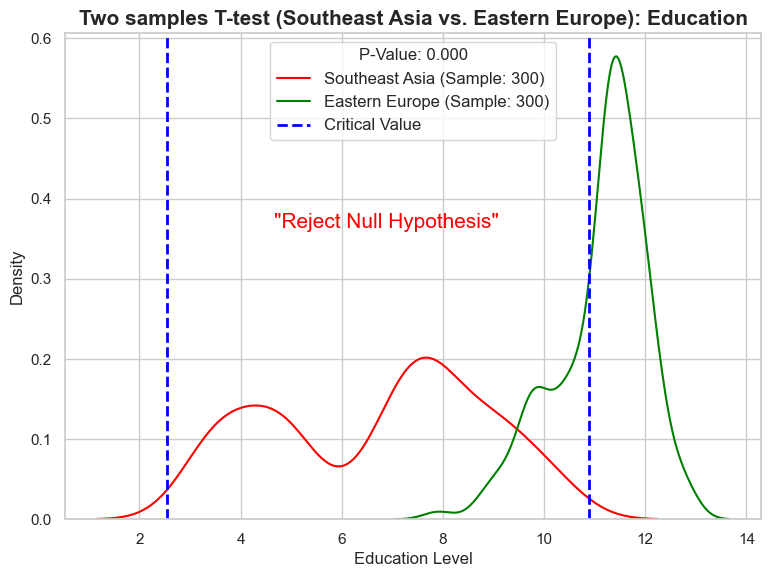

In [ ]:
# Find critical values 
sasia_edu = norm.fit(sample_edu_southeast_asia)
sasia_edu_distribution = norm(loc=np.mean(sample_edu_southeast_asia), scale=np.std(sample_edu_southeast_asia, ddof=1))
eu_edu_distribution = norm(loc=np.mean(sample_edu_eastern_europe), scale=np.std(sample_edu_eastern_europe, ddof=1))
critical_value = sasia_edu_distribution.ppf(0.025)
critical_value2 = sasia_edu_distribution.ppf(0.975)
# Region vs. region samples t-test
plt.figure(figsize=(8, 6))
# Plot the KDE plots for the two samples
sns.kdeplot(sample_edu_southeast_asia, color='red', label='Southeast Asia (Sample: 300)')
sns.kdeplot(sample_edu_eastern_europe, color='green', label='Eastern Europe (Sample: 300)')
plt.xlabel('Education Level')
plt.ylabel('Density')
plt.title('Two samples T-test (Southeast Asia vs. Eastern Europe): Education', fontsize = 15, fontweight='bold')
t_statistic, p_value = stats.ttest_ind(sample_edu_southeast_asia, sample_edu_eastern_europe)
plt.axvline(critical_value, color='blue', linestyle='dashed', linewidth=2, label=f'Critical Value')
plt.axvline(critical_value2, color='blue', linestyle='dashed', linewidth=2)
# Add a legend with the p-value
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper center', fontsize=12)
# Compare the p-value with the significance level 
alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('"Reject Null Hypothesis"', xy=(0.3, 0.6), xycoords='axes fraction', fontsize=15, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('"Fail to Reject Null Hypothesis"', xy=(0.3, 0.6), xycoords='axes fraction', fontsize=15, color='green')
plt.show()

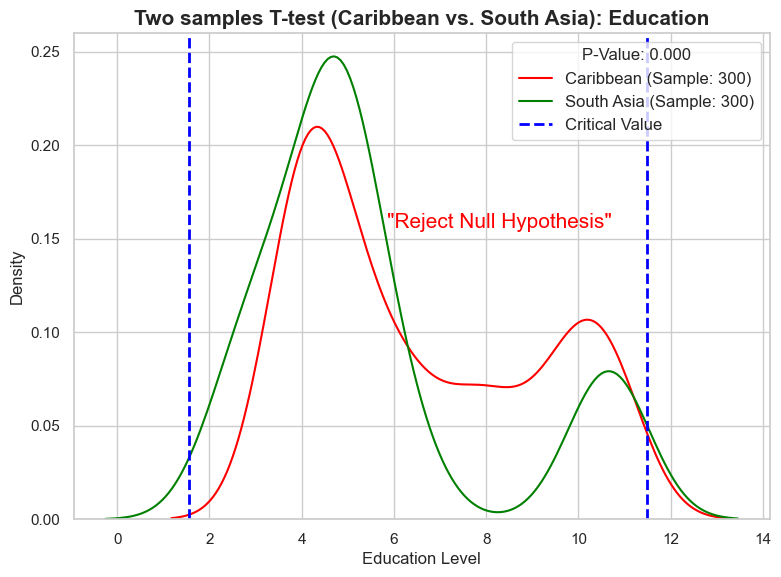

In [ ]:
# Find critical values 
car_edu = norm.fit(sample_edu_caribbean)
car_distribution = norm(loc=np.mean(sample_edu_caribbean), scale=np.std(sample_edu_caribbean, ddof=1))
sasia_distribution = norm(loc=np.mean(sample_edu_south_asia), scale=np.std(sample_edu_south_asia, ddof=1))
critical_value = car_distribution.ppf(0.025)
critical_value2 = car_distribution.ppf(0.975)
# Region vs. region samples t-test
plt.figure(figsize=(8, 6))
# Plot the KDE plots for the two samples
sns.kdeplot(sample_edu_caribbean, color='red', label='Caribbean (Sample: 300)')
sns.kdeplot(sample_edu_south_asia, color='green', label='South Asia (Sample: 300)')
plt.xlabel('Education Level')
plt.ylabel('Density')
plt.title('Two samples T-test (Caribbean vs. South Asia): Education', fontsize = 15, fontweight='bold')
t_statistic, p_value = stats.ttest_ind(sample_edu_caribbean, sample_edu_south_asia, equal_var=True)
plt.axvline(critical_value, color='blue', linestyle='dashed', linewidth=2, label=f'Critical Value')
plt.axvline(critical_value2, color='blue', linestyle='dashed', linewidth=2)
# Add a legend with the p-value
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper right', fontsize=12)
# Compare the p-value with the significance level 
alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('"Reject Null Hypothesis"', xy=(0.45, 0.6), xycoords='axes fraction', fontsize=15, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('"Fail to Reject Null Hypothesis"', xy=(0.65, 0.6), xycoords='axes fraction', fontsize=15, color='green')
plt.show()

Sample by GDP per capita

In [ ]:
# Separate by 'region' data from the population
sub_sahara_gdp_data = final_data[final_data['region_txt'] == 'Sub-Saharan Africa']['GDP per capita']
mena_gdp_data = final_data[final_data['region_txt'] == 'Middle East & North Africa']['GDP per capita']
western_europe_gdp_data = final_data[final_data['region_txt'] == 'Western Europe']['GDP per capita']
south_america_gdp_data = final_data[final_data['region_txt'] == 'South America']['GDP per capita']
north_america_gdp_data = final_data[final_data['region_txt'] == 'North America']['GDP per capita']
south_asia_gdp_data = final_data[final_data['region_txt'] == 'South Asia']['GDP per capita']
southeast_asia_gdp_data = final_data[final_data['region_txt'] == 'Southeast Asia']['GDP per capita']
central_asia_gdp_data = final_data[final_data['region_txt'] == 'Central Asia']['GDP per capita']
eastern_europe_gdp_data = final_data[final_data['region_txt'] == 'Eastern Europe']['GDP per capita']
caribbean_gdp_data = final_data[final_data['region_txt'] == 'Central America & Caribbean']['GDP per capita']
oceania_gdp_data = final_data[final_data['region_txt'] == 'Australasia & Oceania']['GDP per capita']
# Select the sample size
sample_size = 300
# Create the sample variables
sample_gdp_sub_sahara= np.random.choice(sub_sahara_gdp_data, size=sample_size)
sample_gdp_mena = np.random.choice(mena_gdp_data, size=sample_size)
sample_gdp_western_europe = np.random.choice(western_europe_gdp_data, size=sample_size)
sample_gdp_south_america = np.random.choice(south_america_gdp_data, size=sample_size)
sample_gdp_north_america = np.random.choice(north_america_gdp_data, size=sample_size)
sample_gdp_south_asia = np.random.choice(south_asia_gdp_data, size=sample_size)
sample_gdp_southeast_asia = np.random.choice(southeast_asia_gdp_data, size=sample_size)
sample_gdp_central_asia = np.random.choice(central_asia_gdp_data, size=sample_size)
sample_gdp_eastern_europe = np.random.choice(eastern_europe_gdp_data, size=sample_size)
sample_gdp_western_europe = np.random.choice(western_europe_gdp_data, size=sample_size)
sample_gdp_caribbean = np.random.choice(caribbean_gdp_data, size=sample_size)
sample_gdp_oceania = np.random.choice(oceania_gdp_data, size=sample_size)
# Perform the t-test between two regions 
t_statistic_gdp, p_value_gdp = stats.ttest_ind(southeast_asia_gdp_data, sample_gdp_sub_sahara)
# Print the results
print("T-Statistic:", t_statistic_gdp)
print("P-Value:", p_value_gdp)

T-Statistic: 9.23653739177865
P-Value: 1.6936829393894284e-18


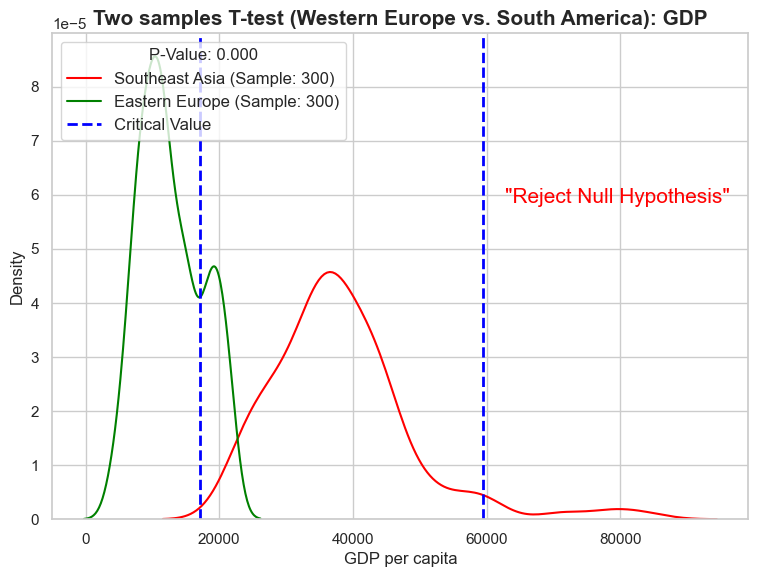

In [ ]:
# Find critical values 
we_gdp = norm.fit(sample_gdp_western_europe)
we_distribution = norm(loc=np.mean(sample_gdp_western_europe), scale=np.std(sample_gdp_western_europe, ddof=1))
same_distribution = norm(loc=np.mean(sample_gdp_south_america), scale=np.std(sample_gdp_south_america, ddof=1))
critical_value = we_distribution.ppf(0.025)
critical_value2 = we_distribution.ppf(0.975)
# Region vs. region samples t-test (GDP per capita)
plt.figure(figsize=(8, 6))
# Plot the KDE plots for the two samples
sns.kdeplot(sample_gdp_western_europe, color='red', label='Southeast Asia (Sample: 300)')
sns.kdeplot(sample_gdp_south_america, color='green', label='Eastern Europe (Sample: 300)')
plt.xlabel('GDP per capita')
plt.ylabel('Density')
plt.title('Two samples T-test (Western Europe vs. South America): GDP', fontsize = 15, fontweight='bold')
t_statistic, p_value = stats.ttest_ind(sample_gdp_western_europe, sample_gdp_south_america, equal_var=True)
plt.axvline(critical_value, color='blue', linestyle='dashed', linewidth=2, label=f'Critical Value')
plt.axvline(critical_value2, color='blue', linestyle='dashed', linewidth=2)

# Add a legend with the p-value
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper left', fontsize=12)
# Compare the p-value with the significance level 
alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('"Reject Null Hypothesis"', xy=(0.65, 0.65), xycoords='axes fraction', fontsize=15, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('"Fail to Reject Null Hypothesis"', xy=(0.65, 0.65), xycoords='axes fraction', fontsize=15, color='green')
plt.show()

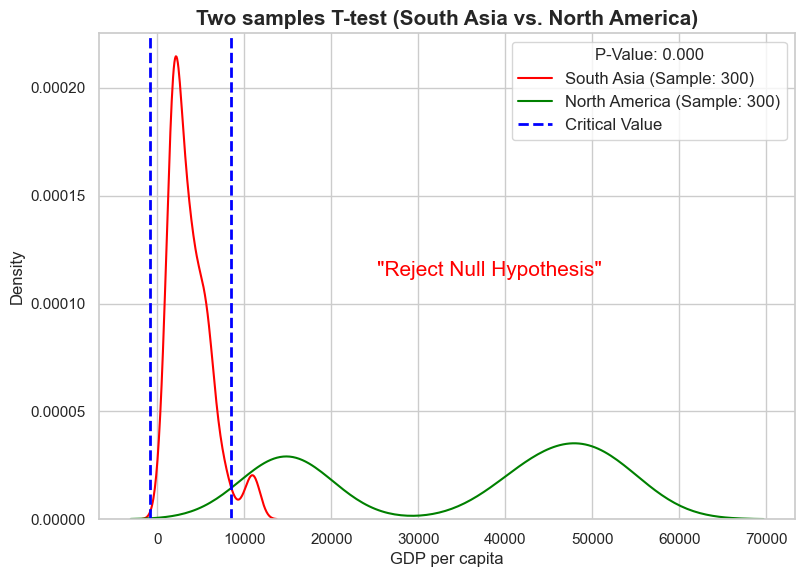

In [ ]:
# Find critical values 
sasia_gdp = norm.fit(sample_gdp_south_asia)
sasia_distribution = norm(loc=np.mean(sample_gdp_south_asia), scale=np.std(sample_gdp_south_asia, ddof=1))
name_distribution = norm(loc=np.mean(sample_gdp_north_america), scale=np.std(sample_gdp_north_america, ddof=1))
critical_value = sasia_distribution.ppf(0.025)
critical_value2 = sasia_distribution.ppf(0.975)
# Region vs. region samples t-test (GDP per capita)
plt.figure(figsize=(8, 6))
# Plot the KDE plots for the two samples
sns.kdeplot(sample_gdp_south_asia, color='red', label='South Asia (Sample: 300)')
sns.kdeplot(sample_gdp_north_america, color='green', label='North America (Sample: 300)')
plt.xlabel('GDP per capita')
plt.ylabel('Density')
plt.title('Two samples T-test (South Asia vs. North America)', fontsize = 15, fontweight='bold')
t_statistic, p_value = stats.ttest_ind(sample_gdp_south_asia, sample_gdp_north_america, equal_var=True)
# Add the t-statistic as a vertical dashed line on the plot
plt.axvline(critical_value, color='blue', linestyle='dashed', linewidth=2, label=f'Critical Value')
plt.axvline(critical_value2, color='blue', linestyle='dashed', linewidth=2)

# Add a legend with the p-value
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper right', fontsize=12)
# Compare the p-value with the significance level 
alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('"Reject Null Hypothesis"', xy=(0.4, 0.5), xycoords='axes fraction', fontsize=15, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('"Fail to Reject Null Hypothesis"', xy=(0.45, 0.5), xycoords='axes fraction', fontsize=15, color='green')
plt.show()

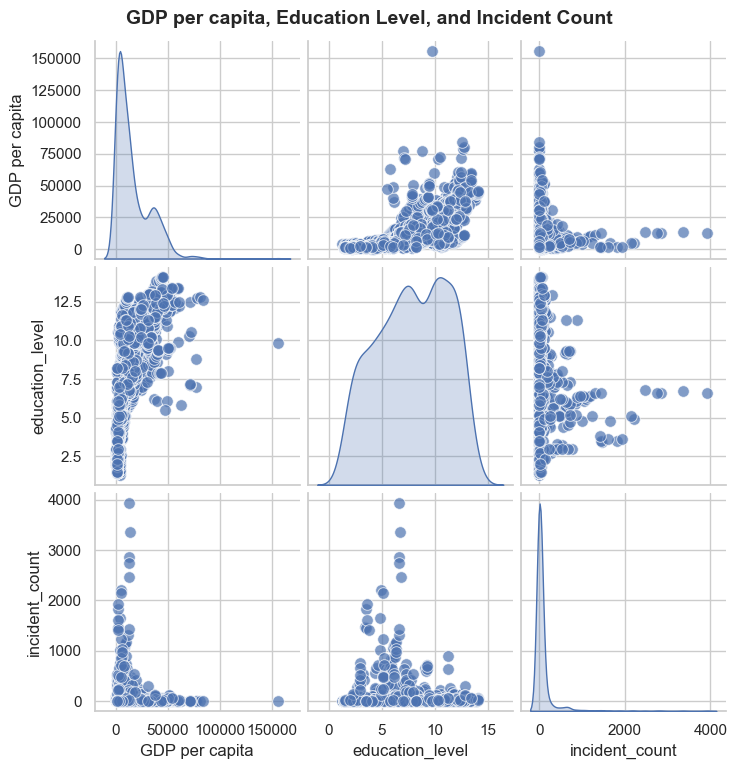

In [ ]:
variables = ['GDP per capita', 'education_level', 'incident_count']
sns.set(style='whitegrid')

sns.pairplot(final_data[variables], diag_kind='kde', plot_kws={'alpha': 0.7, 's': 70})
plt.suptitle('GDP per capita, Education Level, and Incident Count', fontsize=14, fontweight='bold', y=1.02)
plt.show()

Distribution of features

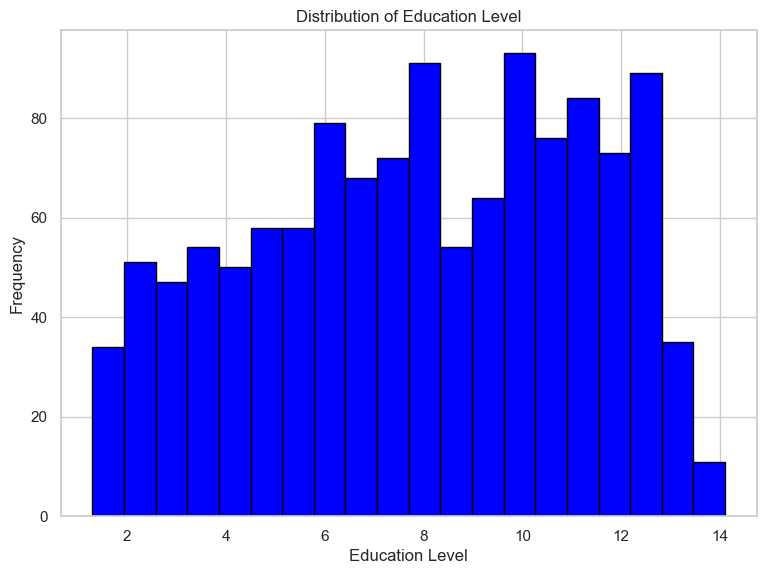

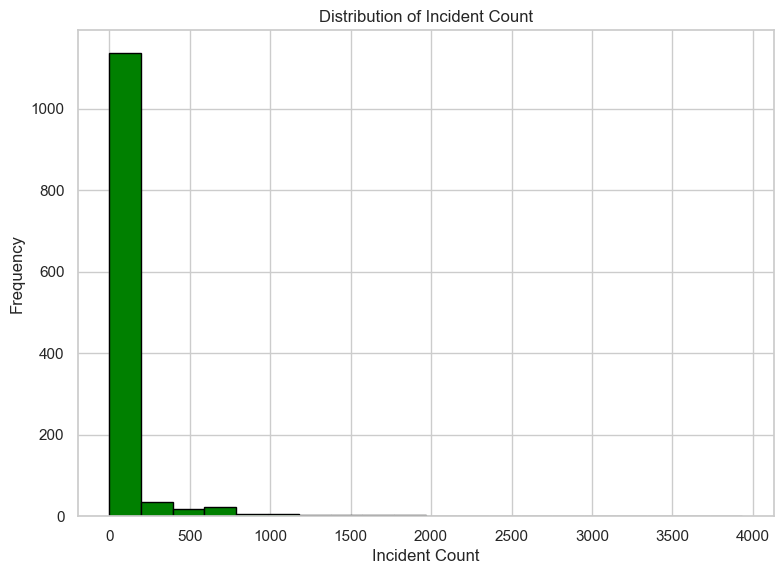

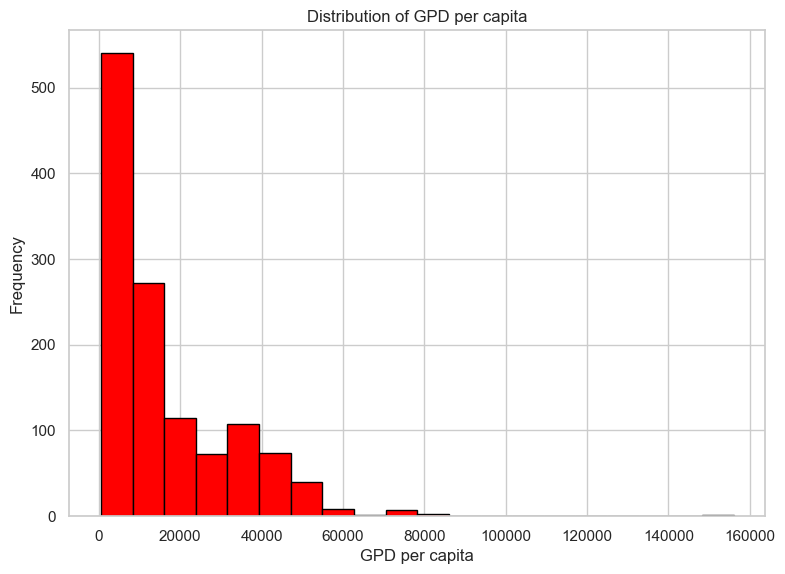

In [ ]:
education_level_cleaned = final_data['education_level']
incident_count_cleaned = final_data['incident_count']
gdp_cleaned = final_data['GDP per capita']

plt.figure(figsize=(8, 6))
plt.hist(education_level_cleaned, bins=20, color='blue', edgecolor='black')
plt.xlabel('Education Level')
plt.ylabel('Frequency')
plt.title('Distribution of Education Level')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(incident_count_cleaned, bins=20, color='green', edgecolor='black')
plt.xlabel('Incident Count')
plt.ylabel('Frequency')
plt.title('Distribution of Incident Count')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(gdp_cleaned, bins=20, color='red', edgecolor='black')
plt.xlabel('GPD per capita')
plt.ylabel('Frequency')
plt.title('Distribution of GPD per capita')
plt.grid(True)
plt.show()

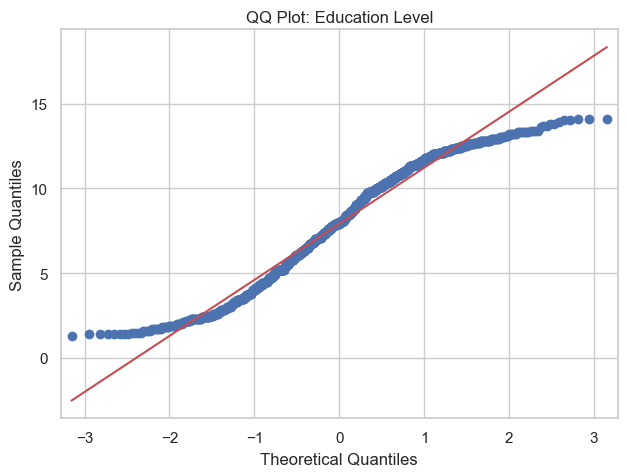

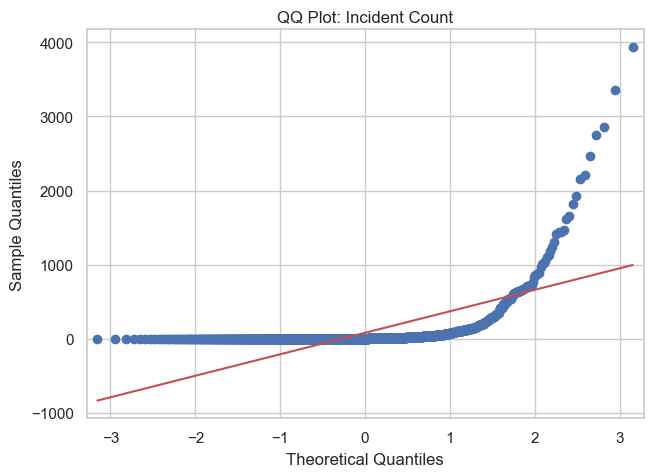

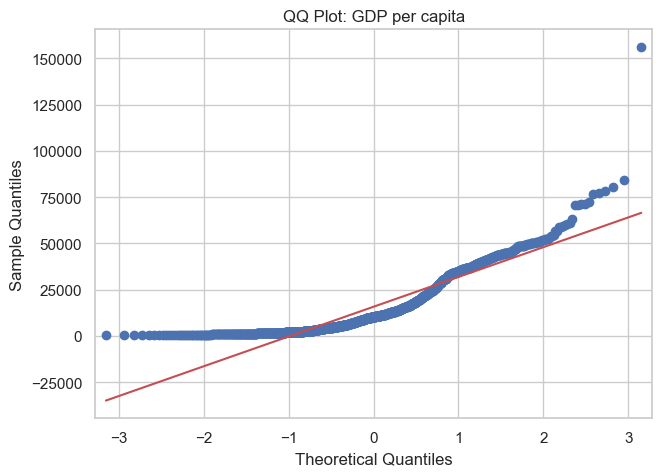

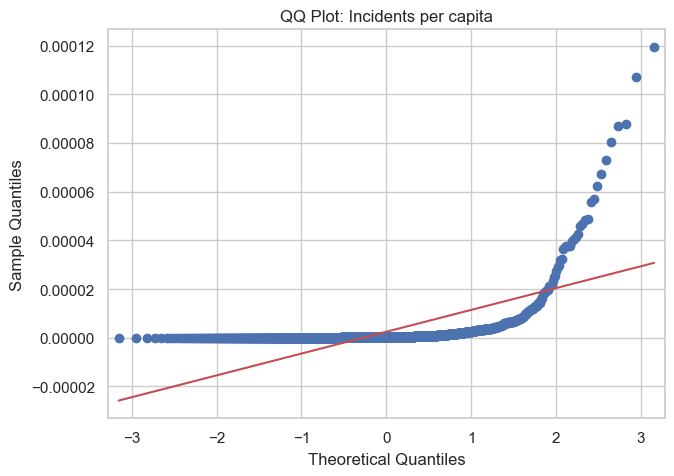

In [ ]:
education_level = final_data['education_level']
incident_count = final_data['incident_count']
region_txt = final_data['region_txt']
gdp_per_capita = final_data['GDP per capita']
incident_per_capita = final_data['incident_per_capita']

sm.qqplot(education_level, line='s')
plt.title('QQ Plot: Education Level')
plt.show()

sm.qqplot(incident_count, line='s')
plt.title('QQ Plot: Incident Count')
plt.show()

sm.qqplot(gdp_per_capita, line='s')
plt.title('QQ Plot: GDP per capita')
plt.show()


sm.qqplot(incident_per_capita, line='s')
plt.title('QQ Plot: Incidents per capita')
plt.show()

#### T-test between high incident and low incident groups. Group is devided by 'median' value of the incident counts (23)

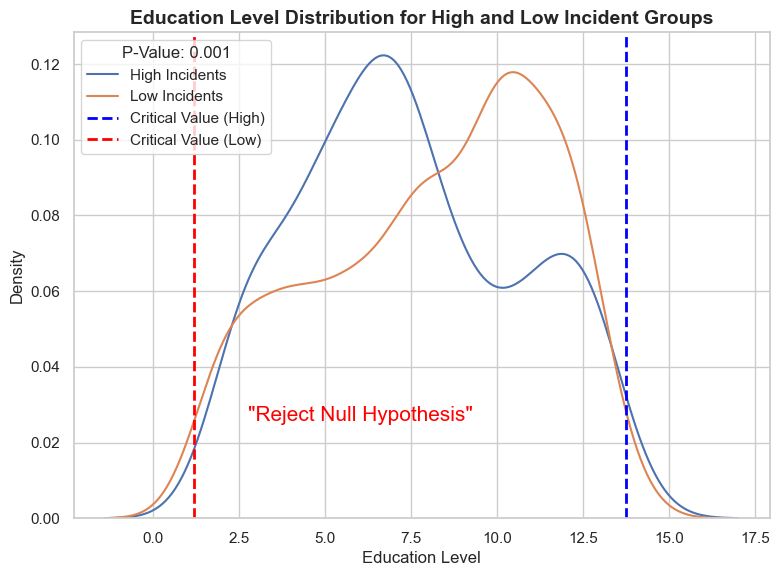

In [ ]:
high_incident_group = final_data[final_data['incident_count'] > 17]
low_incident_group = final_data[final_data['incident_count'] <= 17]

# Extract the 'education_level' column as 1D arrays
high_education_levels = high_incident_group['education_level'].values
low_education_levels = low_incident_group['education_level'].values

# Calculate the mean and standard deviation of each group
high_mean = np.mean(high_education_levels)
high_std = np.std(high_education_levels, ddof=1)
low_mean = np.mean(low_education_levels)
low_std = np.std(low_education_levels, ddof=1)

# Create normal distributions for each group
high_distribution = norm(loc=high_mean, scale=high_std)
low_distribution = norm(loc=low_mean, scale=low_std)

# Find critical values for each group
critical_value_high = high_distribution.ppf(0.975)
critical_value_low = high_distribution.ppf(0.025)

# Perform t-test
t_stat, p_value_ttest = ttest_ind(high_education_levels, low_education_levels)



# Plot the KDE plots
plt.figure(figsize=(8, 6))
sns.kdeplot(high_education_levels, label='High Incidents')
sns.kdeplot(low_education_levels, label='Low Incidents')
plt.axvline(critical_value_high, color='blue', linestyle='dashed', linewidth=2, label='Critical Value (High)')
plt.axvline(critical_value_low, color='red', linestyle='dashed', linewidth=2, label='Critical Value (Low)')

plt.xlabel('Education Level')
plt.ylabel('Density')
plt.title('Education Level Distribution for High and Low Incident Groups', fontsize=14, fontweight='bold')
plt.legend(title=f"P-Value: {p_value_ttest:.3f}", loc='upper left')

alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('"Reject Null Hypothesis"', xy=(0.25, 0.2), xycoords='axes fraction', fontsize=15, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('"Fail to Reject Null Hypothesis"', xy=(0.25, 0.2), xycoords='axes fraction', fontsize=15, color='green')
plt.show()


Bar plots between low and high incident group

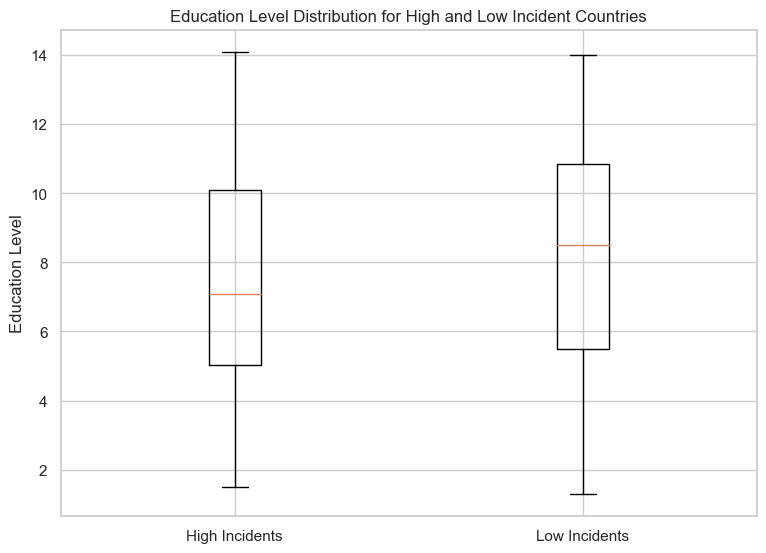

In [ ]:
plt.figure(figsize=(8, 6))
plt.boxplot([high_incident_group['education_level'], low_incident_group['education_level']], labels=['High Incidents', 'Low Incidents'])
plt.ylabel('Education Level')
plt.title('Education Level Distribution for High and Low Incident Countries', )
plt.show()

In [ ]:
new_final = final_data.groupby(['country_txt', 'region_txt']).agg({
    'incident_count': 'sum',
    'GDP per capita': 'mean',
    'education_level': 'mean'
}).reset_index()

new_final['constant'] = 1

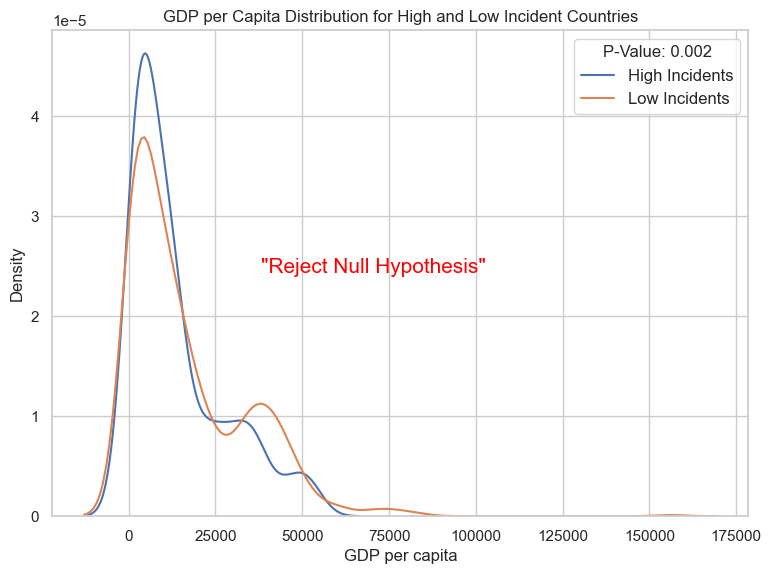

In [ ]:

high_gdp_group = final_data[final_data['incident_count'] > 17]
low_gpd_group = final_data[final_data['incident_count'] <= 17]

# Extract the 'GDP per capita' column as 1D arrays
high_gdp = high_gdp_group['GDP per capita'].values
low_gdp = low_gpd_group['GDP per capita'].values

# Calculate the mean and standard deviation of each group
high_mean = np.mean(high_gdp)
high_std = np.std(high_gdp, ddof=1)
low_mean = np.mean(low_gdp)
low_std = np.std(low_gdp, ddof=1)

# Find critical values for each group using t-distribution
#df_high = len(high_gdp) - 1
critical_value_gdp_high = t.ppf(0.975, high_mean)
critical_value_gdp_low = t.ppf(0.025, high_mean)

# Perform t-test
t_stat, p_value_ttest = ttest_ind(high_gdp, low_gdp)

# Plot the KDE plots
plt.figure(figsize=(8, 6))
sns.kdeplot(high_gdp, label='High Incidents')
sns.kdeplot(low_gdp, label='Low Incidents')
#plt.axvline(critical_value_gdp_high, color='blue', linestyle='dashed', linewidth=2, label='Critical Value (High)')
#plt.axvline(critical_value_gdp_low, color='red', linestyle='dashed', linewidth=2, label='Critical Value (Low)')

plt.xlabel('GDP per capita')
plt.ylabel('Density')
plt.title('GDP per Capita Distribution for High and Low Incident Countries')
plt.legend(title=f"P-Value: {p_value_ttest:.3f}", loc='upper right', fontsize=12)

alpha = 0.05
if p_value_ttest < alpha:
    # Reject the null hypothesis
    plt.annotate('"Reject Null Hypothesis"', xy=(0.3, 0.5), xycoords='axes fraction', fontsize=15, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('"Fail to Reject Null Hypothesis"', xy=(0.3, 0.5), xycoords='axes fraction', fontsize=15, color='green')
plt.show()


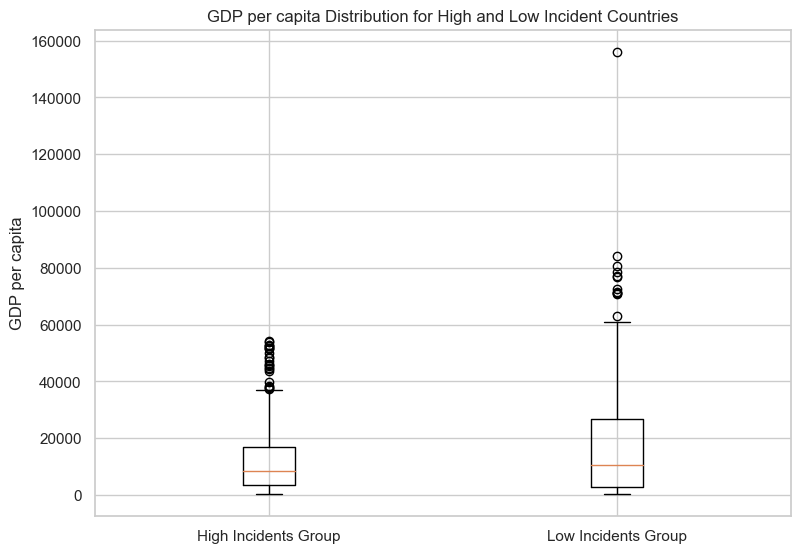

In [ ]:
plt.figure(figsize=(8, 6))
plt.boxplot([high_incident_group['GDP per capita'], low_incident_group['GDP per capita']], labels=['High Incidents Group', 'Low Incidents Group'])
plt.ylabel('GDP per capita')
plt.title('GDP per capita Distribution for High and Low Incident Countries')
plt.show()

In [ ]:
new_final = final_data.groupby(['country_txt', 'region_txt']).agg({
    'incident_count': 'sum',
    'GDP per capita': 'mean',
    'education_level': 'mean'
}).reset_index()

new_final['constant'] = 1

new_final

,country_txt,region_txt,incident_count,GDP per capita,education_level,constant
0,Afghanistan,South Asia,12593,1437.658194,3.035294,1
1,Albania,Eastern Europe,13,8836.755750,9.512500,1
2,Algeria,Middle East & North Africa,1212,11560.511588,7.176471,1
3,Angola,Sub-Saharan Africa,57,5982.143733,4.733333,1
4,Argentina,South America,24,17885.798167,9.616667,1
...,...,...,...,...,...,...
132,Venezuela,South America,56,16560.460417,8.741667,1
133,Vietnam,Southeast Asia,6,4668.886200,6.900000,1
134,Yemen,Middle East & North Africa,3230,4023.590600,2.418750,1
135,Zambia,Sub-Saharan Africa,3,2538.302300,6.550000,1


In [ ]:
X = new_final[['GDP per capita', 'education_level', 'constant']]
y = new_final['incident_count']

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Get the predicted incident count from the model
new_final['predicted_incident_count'] = model.predict(X)

# Group the data by 'region_txt' and find the country with the highest predicted incident count in each region
highest_incidents_by_region = new_final.groupby('region_txt').apply(lambda group: group.loc[group['predicted_incident_count'].idxmax()])

# Print the result
result_regression = highest_incidents_by_region[['region_txt', 'country_txt', 'predicted_incident_count']]
result_regression


,region_txt,country_txt,predicted_incident_count
region_txt,,,
Australasia & Oceania,Australasia & Oceania,New Zealand,180.418355
Central America & Caribbean,Central America & Caribbean,Guatemala,1290.011879
Central Asia,Central Asia,Turkmenistan,669.611034
East Asia,East Asia,China,895.039584
Eastern Europe,Eastern Europe,Albania,628.161630
Middle East & North Africa,Middle East & North Africa,Yemen,1493.805818
North America,North America,Mexico,756.546284
South America,South America,Bolivia,895.920806
South Asia,South Asia,Afghanistan,1440.730371


In [ ]:
new_final.head(3)

,country_txt,region_txt,incident_count,GDP per capita,education_level,constant,predicted_incident_count
0,Afghanistan,South Asia,12593,1437.658194,3.035294,1,1440.730371
1,Albania,Eastern Europe,13,8836.755750,9.512500,1,628.161630
2,Algeria,Middle East & North Africa,1212,11560.511588,7.176471,1,881.441701


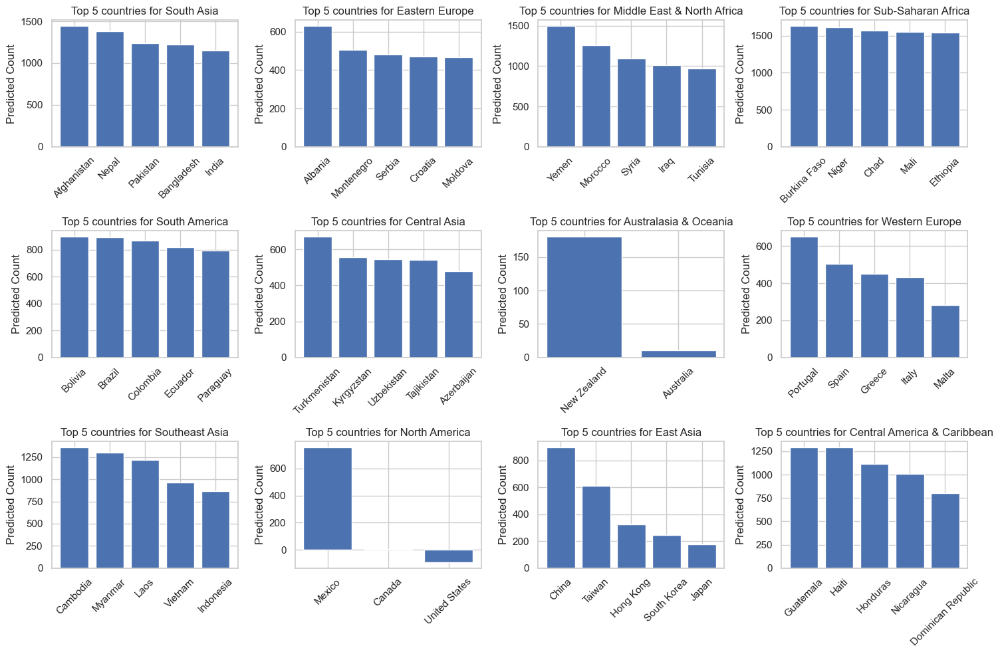

In [ ]:
import matplotlib.pyplot as plt

# Sort by regions
unique_regions = new_final['region_txt'].unique()

plt.figure(figsize=(15, 10))

# Create bar charts with for loop
for i, region in enumerate(unique_regions, start=1):
    plt.subplot(3, 4, i)
    region_data = new_final[new_final['region_txt'] == region]
    
    # Sort the data
    region_data_sorted = region_data.sort_values(by='predicted_incident_count', ascending=False)
    
    # Limit top 5 countries within regions
    top_countries = region_data_sorted.head(5)
    countries = top_countries['country_txt']
    predicted_incident_counts = top_countries['predicted_incident_count']
    
    # Create the bar chart
    plt.bar(range(len(top_countries)), predicted_incident_counts)
    
    # Set the xticks with country names
    plt.xticks(range(len(top_countries)), countries, rotation=45)
    
    # Set the plot title and labels
    plt.title(f'Top 5 countries for {region}')
    plt.ylabel('Predicted Count')

plt.tight_layout()
plt.show()

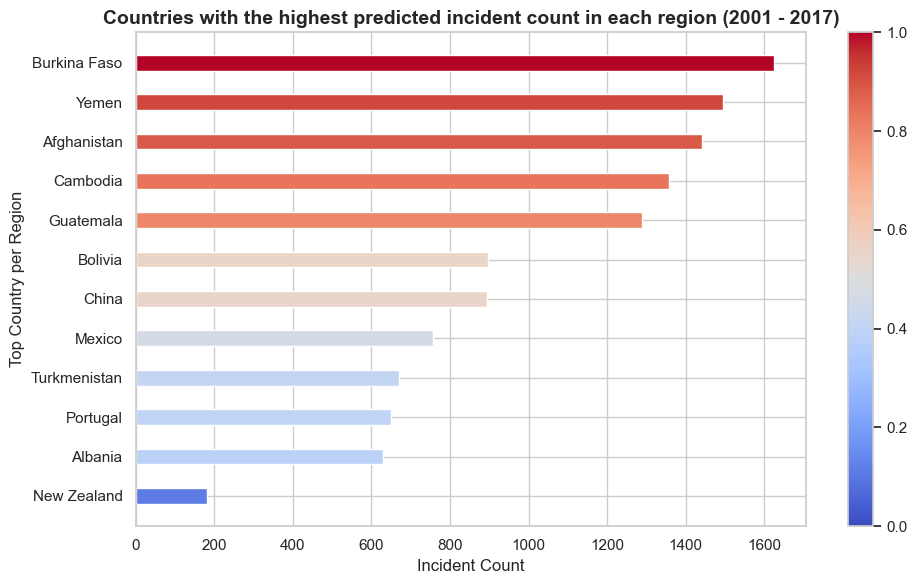

In [ ]:
plt.figure(figsize=(10, 6))
bar_width = 0.4

highest_incidents_by_region_sorted = highest_incidents_by_region.sort_values(by='predicted_incident_count', ascending=True)

index = np.arange(len(highest_incidents_by_region_sorted))

# Set color map with viridis
color_map = 'coolwarm'

# Create the bar chart with gradation
bars = plt.barh(index, highest_incidents_by_region_sorted['predicted_incident_count'], 
                height=bar_width, color=plt.cm.get_cmap(color_map)(highest_incidents_by_region_sorted['predicted_incident_count'] 
                                                                   / highest_incidents_by_region_sorted['predicted_incident_count'].max()))

# Add a color bar
cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(cmap=color_map))

plt.xlabel('Incident Count')
plt.ylabel('Top Country per Region')
plt.title('Countries with the highest predicted incident count in each region (2001 - 2017)', fontsize=14, fontweight='bold')
plt.yticks(index, highest_incidents_by_region_sorted['country_txt'])
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Calculate R-squared
r_squared = model.rsquared

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y, model.predict(X))

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y, model.predict(X))

print(f"R-squared: {r_squared:.3f}")
print(f"Mean Squared Error (MSE): {mse:.3f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.3f}")
print(f"Mean Absolute Error (MAE): {mae:.3f}")


R-squared: 0.030
Mean Squared Error (MSE): 7153332.207
Root Mean Squared Error (RMSE): 2674.571
Mean Absolute Error (MAE): 1122.092


# Logistic regression

In [ ]:
final_data

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level,incident_binary
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2,0
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7,0
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1,1
3,2001,Angola,Sub-Saharan Africa,40,2162.4850,16941584.0,2.361054e-06,4.4,0
4,2001,Argentina,South America,2,13651.9810,37480492.0,5.336109e-08,9.1,0
...,...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,12879.1350,30563430.0,5.562203e-07,10.3,0
1237,2017,Vietnam,Southeast Asia,2,6422.0864,94033048.0,2.126912e-08,8.2,0
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,3.0,1
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0,0


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Create a binary target variable based on median incident count
median_incident_count = final_data['incident_count'].median()
final_data['incident_binary'] = (final_data['incident_count'] > median_incident_count).astype(int)

# Define predictors and target variable
logistic_X = final_data[['education_level', 'GDP per capita']]
logistic_y = final_data['incident_binary']

# Scale the predictors
scaler = StandardScaler()
logistic_X_scaled = scaler.fit_transform(logistic_X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(logistic_X_scaled, logistic_y, test_size=0.2, random_state=42)

# Fit the logistic regression model
logistic_model = sm.Logit(y_train, sm.add_constant(X_train)).fit()
print(logistic_model.summary())

# Make predictions on the test set
y_pred = logistic_model.predict(sm.add_constant(X_test))
y_pred_binary = (y_pred > 0.5).astype(int)

# Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_binary))


Optimization terminated successfully.
         Current function value: 0.684770
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:        incident_binary   No. Observations:                  992
Model:                          Logit   Df Residuals:                      989
Method:                           MLE   Df Model:                            2
Date:                Fri, 04 Aug 2023   Pseudo R-squ.:                 0.01104
Time:                        17:18:01   Log-Likelihood:                -679.29
converged:                       True   LL-Null:                       -686.87
Covariance Type:            nonrobust   LLR p-value:                 0.0005096
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0806      0.064     -1.259      0.208      -0.206       0.045
x1            -0.2388      0.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import statsmodels.api as sm

# Create a binary target variable based on mean incident count
mean_incident_count = final_data['incident_count'].mean()
final_data['incident_binary'] = (final_data['incident_count'] > mean_incident_count).astype(int)

# Define predictors and target variable
logistic_X = final_data[['education_level', 'GDP per capita']]
logistic_y = final_data['incident_binary']

# Scale the predictors
scaler = StandardScaler()
logistic_X_scaled = scaler.fit_transform(logistic_X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(logistic_X_scaled, logistic_y, test_size=0.2, random_state=42)

# Fit the logistic regression model
logistic_model = sm.Logit(y_train, sm.add_constant(X_train)).fit()
print(logistic_model.summary())

# Make predictions on the test set
y_pred = logistic_model.predict(sm.add_constant(X_test))
y_pred_binary = (y_pred > 0.5).astype(int)

# Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_binary))


Optimization terminated successfully.
         Current function value: 0.417171
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:        incident_binary   No. Observations:                  992
Model:                          Logit   Df Residuals:                      989
Method:                           MLE   Df Model:                            2
Date:                Fri, 04 Aug 2023   Pseudo R-squ.:                 0.05218
Time:                        17:18:13   Log-Likelihood:                -413.83
converged:                       True   LL-Null:                       -436.62
Covariance Type:            nonrobust   LLR p-value:                 1.275e-10
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.8214      0.102    -17.773      0.000      -2.022      -1.621
x1            -0.1574      0.